# Imports

In [1]:
import os
from typing import Dict, List, Tuple

import ax
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.utils.notebook.plotting import init_notebook_plotting, render

import torch
import sympy
import numpy as np
import control as ctrl

# Plotting Tools
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Circuit Simulation Tools
from PySpice.Spice.Netlist import Circuit
from PySpice.Unit import *
# import PySpice.Logging.Logging as Logging

# Custom Module (SymXplorer)
from symxplorer.symbolic_solver.domains    import ExperimentResult
from symxplorer.symbolic_solver.filter     import Filter_Classifier

from symxplorer.designer_tools.utils       import weighted_mse_loss
from symxplorer.designer_tools.visualizer  import Visualizer
from symxplorer.designer_tools.sizing      import Ax_TF_Fitter, Sizing_Assist, Transfer_Func_Helper
from symxplorer.designer_tools.tf_models   import First_Order_LP_TF, Second_Order_LP_TF, Second_Order_BP_TF, Pole_Zero_TF

helper_funcs = Transfer_Func_Helper()


Using device: cpu and dtype: torch.float64


In [2]:
path_to_pkl = "Runs/VLSI_CMMF_Automated_NA/results.pkl"
symbolic_experiment_result = ExperimentResult("Sizing Stage")
symbolic_experiment_result = symbolic_experiment_result.load(path_to_pkl)

# First Order Filter

## Setting the Target

In [ ]:
target_tf = First_Order_LP_TF(fc=1e3, dc_gain=20)
target_tf = target_tf.get_tf()
target_tf

In [ ]:
Visualizer(tf=target_tf).visualize(1, 7)

## Setting the Symbolic TF to Size

In [ ]:
# Manual overwrite
s = sympy.symbols("s")

R1, R2, R3, R4 = sympy.symbols("R_1, R_2, R_3 R_4")
C1, C2, C3     = sympy.symbols("C_1, C_2, C_3")

# tf_expr_symbolic =  R1*R2/C2*s/(s**2 + R4/(R3*C3)*s + 1/(R3*C3))
tf_expr_symbolic =  R1*R2/(s + 1/(R3*C3))
tf_expr_symbolic

In [ ]:
vis = Visualizer(tf=tf_expr_symbolic)

vis.set_params({
    "R_1" : 1e3,
    "R_2" : 1e3,
    "R_3" : 1e3,
    "C_3" : 1e-12
})

vis.visualize()

## Automated Sizing

In [ ]:
frequencies = torch.logspace(1, 6, 1000)
ax_wrapper = Ax_TF_Fitter(
                    tf_to_size=tf_expr_symbolic,
                    target_tf= target_tf,
                    c_range=[1e-12, 1e-9],
                    r_range=[1e2, 1e5],
                    frequencies=frequencies,
                    random_seed=42
                        )

In [ ]:
ax_wrapper.parameterize()
ax_wrapper.create_experiment()

In [ ]:
ax_wrapper.optimization_loop(40)

## Visualization

In [ ]:
params, index = ax_wrapper.get_best()
params

In [ ]:
ax_wrapper.plot_solution(params)

In [ ]:
ax_wrapper.render_contour_plot("R_3", "C_3")

# Second Order BP Filters

In [2]:
path_to_pkl = "Runs/VLSI_CMMF_Automated_NA/results.pkl"
symbolic_experiment_result = ExperimentResult("Sizing Stage")
symbolic_experiment_result = symbolic_experiment_result.load(path_to_pkl)

In [3]:
bp_filters = symbolic_experiment_result.get_filter_types("BP")

In [ ]:
idx = 10
tf_expr_symbolic = bp_filters[idx].transferFunc
tf_expr_symbolic

## Setting Up the Target

In [ ]:
frequencies = torch.logspace(1, 9, 20000)
target_tf = Second_Order_BP_TF(q=3, fc=1e5, k_bp=1)
target_tf = target_tf.get_tf()
target_tf

In [6]:
# Define range
lower_bound = 0.5e4
upper_bound = 5e4

# Generate binary mask
weighted_frequencies = torch.where((frequencies >= lower_bound) & (frequencies <= upper_bound), 1, 1)

In [ ]:
ax_wrapper = Ax_TF_Fitter(
                    tf_to_size=tf_expr_symbolic,
                    target_tf= target_tf,
                    c_range=[1e-12, 1e-9],
                    r_range=[1e0, 1e5],
                    frequencies=frequencies,
                    freq_weights=weighted_frequencies,
                    max_mse_loss=50,
                    mse_norm_method="min-max", # choose from None, 'min-max', and 'z-score'
                    random_seed=42
                )

# ax_wrapper.sizing_assist.kill_variable("R_4", "R_1")
# ax_wrapper.sizing_assist.kill_variable("C_6", "C_4")

In [ ]:
ax_wrapper.parameterize(log_scale=True)
ax_wrapper.create_experiment(
    num_sobol_trials  = 20,
    max_parallelism_bo= 3
)

In [ ]:
ax_wrapper.optimization_loop(num_trials=80, include_mag_loss=True, include_phase_loss=True)

## Visualization

In [ ]:
params, index = ax_wrapper.get_best()
params

In [ ]:
ax_wrapper.plot_solution(params)

In [ ]:
selected_params = ax_wrapper.ax_client.get_trial_parameters(40)
selected_params = ax_wrapper.denormalize_params(selected_params)
print(selected_params)
ax_wrapper.plot_solution(selected_params)

In [ ]:
(ax_wrapper.sizing_assist.tf)

In [ ]:
ax_wrapper.sizing_assist.sub_val_design_vars(params).expand()

In [ ]:
ax_wrapper.render_contour_plot("R_1", "C_4")

# Second Order LP Filter

In [23]:
path_to_pkl = "Runs/VLSI_CMMF_Automated_NA/results.pkl"
symbolic_experiment_result = ExperimentResult("Sizing Stage")
symbolic_experiment_result = symbolic_experiment_result.load(path_to_pkl)

In [24]:
lp_filters = symbolic_experiment_result.get_filter_types("LP")

In [ ]:
idx = 5
tf_expr_symbolic = lp_filters[idx].transferFunc
tf_expr_symbolic

In [ ]:
frequencies = torch.logspace(1, 9, 20000)
target_tf = Second_Order_LP_TF(q=3, fc=1e7, dc_gain=1)
target_tf = target_tf.get_tf()
target_tf

In [27]:
# Define range
lower_bound = 0.5e4
upper_bound = 5e4

# Generate binary mask
weighted_frequencies = torch.where((frequencies >= lower_bound) & (frequencies <= upper_bound), 1, 1)

In [ ]:
ax_wrapper = Ax_TF_Fitter(
                    tf_to_size=tf_expr_symbolic,
                    target_tf= target_tf,
                    c_range=[1e-12, 100e-9],
                    r_range=[1e0, 1e5],
                    frequencies=frequencies,
                    freq_weights=weighted_frequencies,
                    max_mse_loss=50,
                    mse_norm_method="z-score", # choose from None, 'min-max', and 'z-score'
                    random_seed=42
                )

# ax_wrapper.sizing_assist.kill_variable("R_4", "R_1")
# ax_wrapper.sizing_assist.kill_variable("C_6", "C_4")
ax_wrapper.parameterize(log_scale=True)
ax_wrapper.create_experiment(
    num_sobol_trials  = 20,
    max_parallelism_bo= 3
)
ax_wrapper.optimization_loop(num_trials=40, include_mag_loss=True, include_phase_loss=True)

In [ ]:
params, index = ax_wrapper.get_best()
params

In [ ]:
ax_wrapper.plot_solution(params)

# Third Order LP

In [3]:
selected_filters = symbolic_experiment_result.get_filter_types("X-INVALID-ORDER")
len(selected_filters)

3190

In [4]:
idx = 2365 # 2365 is the ID of our case study

z_key = selected_filters[idx].zCombo
tf_expr_symbolic = selected_filters[idx].transferFunc
tf_expr_symbolic

R_1*R_2*R_6/(C_1*C_4*C_6*R_1*R_2*R_3*R_5*R_6*s**3 + R_1*R_5 - R_2*R_3 + R_2*R_5 + R_3*R_5 + s**2*(C_1*C_4*R_1*R_2*R_3*R_5 - C_1*C_6*R_1*R_2*R_3*R_6 + C_1*C_6*R_1*R_2*R_5*R_6 + C_1*C_6*R_1*R_3*R_5*R_6 + C_4*C_6*R_2*R_3*R_5*R_6) + s*(-C_1*R_1*R_2*R_3 + C_1*R_1*R_2*R_5 + C_1*R_1*R_3*R_5 + C_4*R_2*R_3*R_5 + C_6*R_1*R_5*R_6 - C_6*R_2*R_3*R_6 + C_6*R_2*R_5*R_6 + C_6*R_3*R_5*R_6))

In [82]:
frequencies = torch.logspace(4, 10, 2000)

# Butterworth Filter (3rd order)
fc = 1e7
target_tf = Second_Order_LP_TF(q=1, fc=1.272*fc, dc_gain=1e3)
target_tf = target_tf.get_tf()
tf2 = First_Order_LP_TF(fc=1*fc, dc_gain=1)

target_tf = target_tf * tf2.get_tf()
target_tf

1000.0/((5.0e-8*s/pi + 1)*(1.54513270835806e-15*s**2/pi**2 + 3.93081761006289e-8*s/pi + 1))

In [83]:
# Define range
lower_bound = 1e6
upper_bound = 12e6

# Generate binary mask
weighted_frequencies = torch.where((frequencies >= lower_bound) & (frequencies <= upper_bound), 1, 0.1)


In [84]:
ax_wrapper = Ax_TF_Fitter(
                    tf_to_size=tf_expr_symbolic,
                    target_tf= target_tf,
                    c_range=[1e-12, 1e-9],
                    r_range=[1e2, 1e5],
                    frequencies=frequencies,
                    freq_weights=weighted_frequencies,
                    max_mse_loss=5e5,
                    mse_norm_method='min-max', # choose from None, 'min-max', and 'z-score'
                    random_seed=42
                )

ax_wrapper.sizing_assist.kill_variable("C_4", "C_1")
ax_wrapper.sizing_assist.kill_variable("C_6", "C_1")

ax_wrapper.parameterize(log_scale=True)
ax_wrapper.create_experiment(
    num_sobol_trials  = 10,
    max_parallelism_bo= 3
)


[INFO 02-04 22:30:33] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.
[INFO 02-04 22:30:33] ax.utils.notebook.plotting: Please see
    (https://ax.dev/tutorials/visualizations.html#Fix-for-plots-that-are-not-rendering)
    if visualizations are not rendering.


Computing filter parameters for BiQuad:   0%|          | 0/1 [00:00<?, ?filter/s]
[INFO 02-04 22:30:33] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[WARNING 02-04 22:30:33] ax.service.ax_client: Random seed set to 42. Note that this setting only affects the Sobol quasi-random generator and BoTorch-powered Bayesian optimization models. For the latter models, setting random seed to the same number for two optimizations will make the generated trials similar, but not exactly the same, and over time the trials will diverge more.
[INFO 02-04 22:30:33] ax.service.utils.instantiation: Created search space: SearchSpace(parameters=[RangeParameter(name='C_1', parameter_type=FLOAT, range=[1.0, 1000.0000000000001], log_scale=True), RangeParameter(name='R_6', parameter_type=FLOAT, range=[1.0, 1000.0], log_scale=True), RangeParameter(name='R_1',

In [86]:
ax_wrapper.optimization_loop(num_trials=50, include_mag_loss=True, include_phase_loss=True)

Optimizing:   0%|          | 0/50 [00:00<?, ?trial/s][INFO 02-04 22:30:44] ax.service.ax_client: Generated new trial 10 with parameters {'C_1': 9.290136, 'R_6': 18.767056, 'R_1': 2.194252, 'R_2': 7.092854, 'R_3': 2.357528, 'R_5': 3.685795} using model BoTorch.
[INFO 02-04 22:30:44] ax.service.ax_client: Completed trial 10 with data: {'tf_fitting_loss': (tensor(0.0047), 0.0), 'l1norm': (tensor(3409.7485), 0)}.
Optimizing:   2%|▏         | 1/50 [00:00<00:45,  1.07trial/s][INFO 02-04 22:30:45] ax.service.ax_client: Generated new trial 11 with parameters {'C_1': 3.818356, 'R_6': 41.923376, 'R_1': 168.906368, 'R_2': 138.377187, 'R_3': 1.440182, 'R_5': 12.868558} using model BoTorch.
[INFO 02-04 22:30:45] ax.service.ax_client: Completed trial 11 with data: {'tf_fitting_loss': (tensor(0.0090), 0.0), 'l1norm': (tensor(36351.5670), 0)}.
Optimizing:   4%|▍         | 2/50 [00:02<00:52,  1.10s/trial][INFO 02-04 22:30:46] ax.service.ax_client: Generated new trial 12 with parameters {'C_1': 5.434682

In [87]:
params, index = ax_wrapper.get_best()
params

Best parameters: {'C_1': 5.5941012531998116, 'R_6': 19.747548444944954, 'R_1': 1000.0, 'R_2': 25.77854032350636, 'R_3': 16.32638471629811, 'R_5': 38.44456994146256}
Best loss: (59, {'C_1': 5.5941012531998116, 'R_6': 19.747548444944954, 'R_1': 1000.0, 'R_2': 25.77854032350636, 'R_3': 16.32638471629811, 'R_5': 38.44456994146256}, ({'tf_fitting_loss': np.float64(0.00021388995905805702), 'l1norm': np.float64(110031.1860418712)}, {'tf_fitting_loss': {'tf_fitting_loss': np.float64(2.6857502674333672e-09), 'l1norm': np.float64(0.0)}, 'l1norm': {'tf_fitting_loss': np.float64(0.0), 'l1norm': np.float64(4589.979894783297)}}))


{'C_1': 5.594101253199812e-12,
 'R_6': 1974.7548444944955,
 'R_1': 100000.0,
 'R_2': 2577.854032350636,
 'R_3': 1632.6384716298112,
 'R_5': 3844.456994146256}

In [88]:
ax_wrapper.plot_solution(params)

mag_loss 9.374482608873224e-05, phase_loss 0.0001201699564419627


In [93]:
ax_wrapper.render_contour_plot(param_x="C_1", param_y="R_1")
ax_wrapper.render_contour_plot(param_x="C_1", param_y="R_2")
ax_wrapper.render_contour_plot(param_x="C_1", param_y="R_3")
ax_wrapper.render_contour_plot(param_x="C_1", param_y="R_5")
ax_wrapper.render_contour_plot(param_x="C_1", param_y="R_6")

ax_wrapper.render_contour_plot(param_x="R_1", param_y="R_2")
ax_wrapper.render_contour_plot(param_x="R_1", param_y="R_3")
ax_wrapper.render_contour_plot(param_x="R_1", param_y="R_5")
ax_wrapper.render_contour_plot(param_x="R_1", param_y="R_6")

ax_wrapper.render_contour_plot(param_x="R_2", param_y="R_3")
ax_wrapper.render_contour_plot(param_x="R_2", param_y="R_5")
ax_wrapper.render_contour_plot(param_x="R_2", param_y="R_6")

[INFO 02-04 22:37:26] ax.service.ax_client: Retrieving contour plot with parameter 'C_1' on X-axis and 'R_1' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:27] ax.service.ax_client: Retrieving contour plot with parameter 'C_1' on X-axis and 'R_2' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:27] ax.service.ax_client: Retrieving contour plot with parameter 'C_1' on X-axis and 'R_3' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:27] ax.service.ax_client: Retrieving contour plot with parameter 'C_1' on X-axis and 'R_5' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:28] ax.service.ax_client: Retrieving contour plot with parameter 'C_1' on X-axis and 'R_6' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:28] ax.service.ax_client: Retrieving contour plot with parameter 'R_1' on X-axis and 'R_2' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:29] ax.service.ax_client: Retrieving contour plot with parameter 'R_1' on X-axis and 'R_3' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:29] ax.service.ax_client: Retrieving contour plot with parameter 'R_1' on X-axis and 'R_5' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:29] ax.service.ax_client: Retrieving contour plot with parameter 'R_1' on X-axis and 'R_6' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:30] ax.service.ax_client: Retrieving contour plot with parameter 'R_2' on X-axis and 'R_3' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:30] ax.service.ax_client: Retrieving contour plot with parameter 'R_2' on X-axis and 'R_5' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


[INFO 02-04 22:37:30] ax.service.ax_client: Retrieving contour plot with parameter 'R_2' on X-axis and 'R_6' on Y-axis, for metric 'tf_fitting_loss'. Remaining parameters are affixed to the middle of their range.


Calculating Phases: 100%|██████████| 500/500 [00:04<00:00, 109.00it/s]


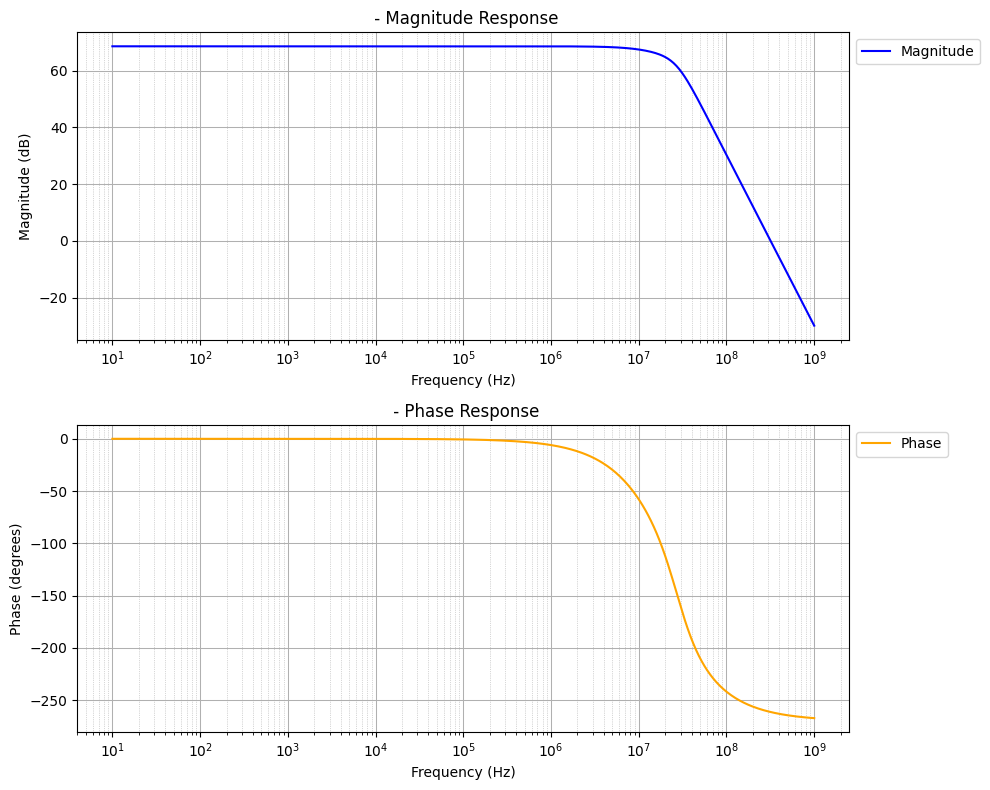

In [13]:
# Manual Solution
assist = ax_wrapper.sizing_assist
assist.visualizer.set_params({
    "C_1" : 5e-12,
    "C_4" : 5e-12,
    "C_6" : 5e-12,
    "R_1" : 2e3,
    "R_2" : 2e3,
    "R_3" : 1e3,
    "R_5" : 1e3,
    "R_6": 2e3,
})

assist.visualizer.visualize(1, 9, 500)

# Playground

In [72]:
from ax.modelbridge.dispatch_utils import choose_generation_strategy
from ax.modelbridge.generation_strategy import GenerationStep, GenerationStrategy
from ax.modelbridge.modelbridge_utils import get_pending_observation_features
from ax.modelbridge.registry import ModelRegistryBase, Models

from ax.utils.testing.core_stubs import get_branin_experiment, get_branin_search_space

In [ ]:
gs = GenerationStrategy(
    steps=[
        # 1. Initialization step (does not require pre-existing data and is well-suited for
        # initial sampling of the search space)
        GenerationStep(
            model=Models.SOBOL,
            num_trials=5,           # How many trials should be produced from this generation step
            min_trials_observed=3,  # How many trials need to be completed to move to next model
            max_parallelism=5,      # Max parallelism for this step
            model_kwargs={"seed": 999},  # Any kwargs you want passed into the model
            model_gen_kwargs={},    # Any kwargs you want passed to `modelbridge.gen`
        ),
        # 2. Bayesian optimization step (requires data obtained from previous phase and learns
        # from all data available at the time of each new candidate generation call)
        GenerationStep(
            model=Models.BOTORCH_MODULAR,
            num_trials=-1,      # No limitation on how many trials should be produced from this step
            max_parallelism=3,  # Parallelism limit for this step, often lower than for Sobol
            # More on parallelism vs. required samples in BayesOpt:
            # https://ax.dev/docs/bayesopt.html#tradeoff-between-parallelism-and-total-number-of-trials
        ),
    ]
)

In [ ]:
print(GenerationStep.__doc__)